<a href="https://colab.research.google.com/github/stev0NaN/performancetest/blob/main/SegundaEntrega_SanchezdelaBarquera.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **LINK A PDF DE PRESENTACIÓN**
[Storytelling](https://docs.google.com/presentation/d/17_558SuLn2HGU4BksphAm_Cly1_4mMLu/edit?usp=sharing&ouid=110018169847109619023&rtpof=true&sd=true)

#**Abstract**





El análisis de datos proporcionados por un GPS es una herramienta valiosa para mejorar el rendimiento de un equipo de fútbol soccer.

Este tipo de análisis permite identificar patrones de movimiento, niveles de esfuerzo y otros datos clave que pueden ser utilizados para optimizar el entrenamiento y la estrategia del equipo.

La audiencia para esta presentación puede incluir entrenadores, jugadores y otros miembros del equipo, así como analistas deportivos.

#**Definición de Objetivo**

La motivación para presentar este análisis de datos es mejorar el rendimiento del equipo y lograr resultados exitosos en el campo de juego.

#**Contexto Empresarial**

El equipo de primera división llamado WIMU TEAM ha decidido tomar en cuenta los datos GPS que sus jugadores del primer equipo tienen durante la semana de prueba de la nueva herramienta para gestionar los entrenamientos y sacar el máximo provecho a cada uno de ellos.

#**Problema Comercial**

Su tarea es interpretar los datos que generan los GPS y generar visualizaciones que respondan las preguntas específicas que tiene el staff de entrenadores, las cuales vemos a continuación:

1.¿Qué tipo de entrenamiento es más popular?

2.¿Qué días de la semana es cuando más carga de trabajo en metros recorridos hay?

3.¿Cuáles son los jugadores con la mayor distancia recorrida?

4.¿Quiénes son los jugadores más veloces? y si existe alguna correlación respecto a su posición en el terreno de juego.

#**Contexto Analítico**

El conjunto de datos "week_sessions" es un archivo en formato CSV que contiene información sobre las sesiones de entrenamiento de los usuarios de una plataforma de monitoreo GPS durante una semana.

El archivo contiene 18 columnas y 548 filas de datos.

Cada fila representa un jugador del equipo, y las columnas proporcionan información sobre la sesión, como el identificador de usuario, la fecha, la duración de la sesión, el tipo de sesión, la distancia recorrida durante la sesión, la distancia recorrida entre intervalos de velocidad y la máxima velocidad alcanzada en Km/h.

#**Data Wrangling**

In [2]:
# Importar Librerías.

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [3]:
# Carga del Dataset desde repo de Github.

url = 'https://raw.githubusercontent.com/stev0NaN/performancetest/main/week_sessions.csv'

week = pd.read_csv(url)
week = pd.DataFrame(week)

In [4]:
# Declarar el Username como Index en nuestro Dataframe

week = week.set_index('Username')

In [5]:
week.head()

,Position,Team Name,Session Date,Match Day,Session Type,Session Name,Task Name,Player Duration,Distance (m),"Speed Zones (m) [0.0, 6.0]","Speed Zones (m) [6.0, 12.0]","Speed Zones (m) [12.0, 18.0]","Speed Zones (m) [18.0, 21.0]","Speed Zones (m) [21.0, 24.0]","Speed Zones (m) [24.0, 50.0]",Max Speed (km/h),Max Speed (Historical Player Maximum)
Username,,,,,,,,,,,,,,,,,
phillippfarber,Midfielder,Wimu team,08/03/2021,+2 MD,Tactical,SESSION 08.03,Session,01:48:14,8133.592821,2821.838135,2873.652588,1458.796509,426.581787,343.451843,209.272110,31.161600,36.390000
nereomarino,Centre Back,Wimu team,08/03/2021,+2 MD,Tactical,SESSION 08.03,Session,01:48:14,5086.417666,2020.478394,2062.734131,899.350403,83.303360,20.551388,0.000000,23.587200,33.570000
patrickkrueger,Midfielder,Wimu team,08/03/2021,+2 MD,Tactical,SESSION 08.03,Session,01:29:15,718.713690,431.481506,273.783447,13.448741,0.000000,0.000000,0.000000,15.706800,34.247002
marvinsharpe,Winger,Wimu team,08/03/2021,+2 MD,Tactical,SESSION 08.03,Session,01:48:14,9572.792150,4374.458008,2901.281006,1594.261841,330.291931,249.323852,123.175400,31.323601,37.723999
kianlong,Right Back,Wimu team,08/03/2021,+2 MD,Tactical,SESSION 08.03,Session,01:48:14,8278.748661,3404.831299,2830.495605,1655.305176,237.453812,91.589828,59.072899,31.226398,37.720000


In [6]:
# Identificar Missing Values.

missing_week = week.isnull()
missing_week.head()

,Position,Team Name,Session Date,Match Day,Session Type,Session Name,Task Name,Player Duration,Distance (m),"Speed Zones (m) [0.0, 6.0]","Speed Zones (m) [6.0, 12.0]","Speed Zones (m) [12.0, 18.0]","Speed Zones (m) [18.0, 21.0]","Speed Zones (m) [21.0, 24.0]","Speed Zones (m) [24.0, 50.0]",Max Speed (km/h),Max Speed (Historical Player Maximum)
Username,,,,,,,,,,,,,,,,,
phillippfarber,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
nereomarino,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
patrickkrueger,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
marvinsharpe,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
kianlong,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


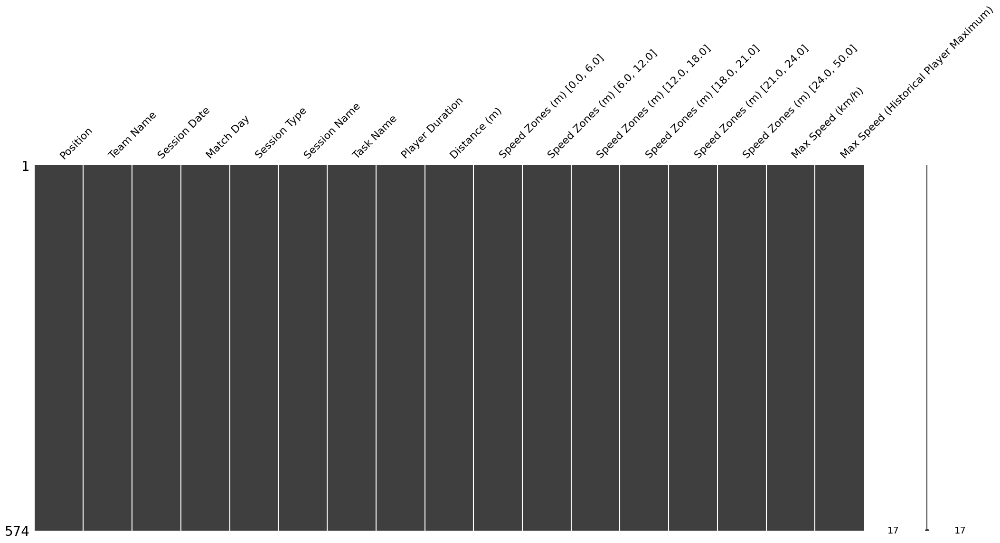

In [7]:
# Identificación por medio de "missingno"

import missingno as msno
msno.matrix(week)
plt.show()

Con estos métodos .isnull() y msno.matrix() se comprueba que no tenemos valores faltantes en ninguna de las columnas de nuestro Dataset, con el código a continuación contamos cuantos "false" o "True" como prueba de que no tenemos faltantes.

In [8]:
# Contar missing values por columna si es que existen.

for column in missing_week.columns.values.tolist():
    print(column)
    print (missing_week[column].value_counts())
    print("")

Position
False    574
Name: Position, dtype: int64

Team Name
False    574
Name: Team Name, dtype: int64

Session Date
False    574
Name: Session Date, dtype: int64

Match Day
False    574
Name: Match Day, dtype: int64

Session Type
False    574
Name: Session Type, dtype: int64

Session Name
False    574
Name: Session Name, dtype: int64

Task Name
False    574
Name: Task Name, dtype: int64

Player Duration
False    574
Name: Player Duration, dtype: int64

Distance (m)
False    574
Name: Distance (m), dtype: int64

Speed Zones (m) [0.0, 6.0]
False    574
Name: Speed Zones (m) [0.0, 6.0], dtype: int64

Speed Zones (m) [6.0, 12.0]
False    574
Name: Speed Zones (m) [6.0, 12.0], dtype: int64

Speed Zones (m) [12.0, 18.0]
False    574
Name: Speed Zones (m) [12.0, 18.0], dtype: int64

Speed Zones (m) [18.0, 21.0]
False    574
Name: Speed Zones (m) [18.0, 21.0], dtype: int64

Speed Zones (m) [21.0, 24.0]
False    574
Name: Speed Zones (m) [21.0, 24.0], dtype: int64

Speed Zones (m) [24.0, 50.

No se ecuentran valores perdidos en el Dataset porque nos da como resultado "False" en las 574 filas que tiene el archivo, si existiera algún "True" el comando hubiese dado la cuenta en el resultado.

In [9]:
# Eliminar filas con índice 'TEAM' ya que son filas que nos dan el promedio del grupo durante el día de entrenamiento.

week = week.drop(week[week.index == 'TEAM'].index)

In [10]:
# Procedemos a revisar que todos los valores tengan el formato adecuado.

week.dtypes

Position                                  object
Team Name                                 object
Session Date                              object
Match Day                                 object
Session Type                              object
Session Name                              object
Task Name                                 object
Player Duration                           object
Distance (m)                             float64
Speed Zones (m) [0.0, 6.0]               float64
Speed Zones (m) [6.0, 12.0]              float64
Speed Zones (m) [12.0, 18.0]             float64
Speed Zones (m) [18.0, 21.0]             float64
Speed Zones (m) [21.0, 24.0]             float64
Speed Zones (m) [24.0, 50.0]             float64
Max Speed (km/h)                         float64
Max Speed (Historical Player Maximum)    float64
dtype: object

Como podemos observar, hay columnas que no tienen un formato adecuado por ejemplo tenemos en la columna "Session Date" un tipo object y es un a fecha,
por lo tanto debe de estar en datetime.

In [11]:
# Procedemos a cambiar el tipo de valores para la fecha y creamos una nueva columna con el nuevo valor.

week["Session Date Convertida"] = pd.to_datetime(week["Session Date"], dayfirst=True)


In [12]:
# Quitamos Columnas que no nos aportan nada para nuestro Análisis

# Lista de nombres de las columnas a eliminar
columnas_a_eliminar = ["Session Date", "Task Name", "Session Name", "Team Name", "Match Day", "Player Duration"]

# Eliminar las columnas del DataFrame
week = week.drop(columnas_a_eliminar, axis=1)


In [13]:
# Se observan las columnas que nos quedan y corroboramos tipo de valores.

week.dtypes

Position                                         object
Session Type                                     object
Distance (m)                                    float64
Speed Zones (m) [0.0, 6.0]                      float64
Speed Zones (m) [6.0, 12.0]                     float64
Speed Zones (m) [12.0, 18.0]                    float64
Speed Zones (m) [18.0, 21.0]                    float64
Speed Zones (m) [21.0, 24.0]                    float64
Speed Zones (m) [24.0, 50.0]                    float64
Max Speed (km/h)                                float64
Max Speed (Historical Player Maximum)           float64
Session Date Convertida                  datetime64[ns]
dtype: object

In [14]:
# Verificar si hay duplicados en el índice
duplicados = week.index.duplicated()

# Verificar si hay algún duplicado
if duplicados.any():

    # Mostrar los índices duplicados
    indices_duplicados = week.index[duplicados]
    print("Se encontraron duplicados en los siguientes índices:")
    print(indices_duplicados)

else:
    print("No se encontraron duplicados en el índice.")

Se encontraron duplicados en los siguientes índices:
Index(['phillippfarber', 'patrickkrueger', 'nereomarino', 'michalmunro',
       'marvinsharpe', 'kianlong', 'davutmeijs', 'luisribeiro', 'marmion',
       'noahbrooks',
       ...
       'patrickkrueger', 'noahbrooks', 'michalmunro', 'marvinsharpe',
       'kianlong', 'georgeconnolly', 'davutmeijs', 'luisribeiro', 'marmion',
       'nereomarino'],
      dtype='object', name='Username', length=507)


Encontramos índex repetidos, ya que son los jugadores que hay en la sesión de entrenamiento por día. Por tal motivo no podemos eliminarlos y se decide agruparlos por Index para no tener faltantes en nuestro Dataset.

In [15]:
# Agrupar índices duplicados
grupos = week.groupby(week.index)

# Mostrar los índices agrupados
print("Índices agrupados:")
for indice, grupo in grupos:
    print(indice)


Índices agrupados:
Ross2
Sergio01
Sullivan2
charliejames
davutmeijs
georgeconnolly
kianlong
luisribeiro
marmion
marvinsharpe
michalmunro
nereomarino
noahbrooks
patrickkrueger
phillippfarber
ricardo
samuelburton
scottmontague


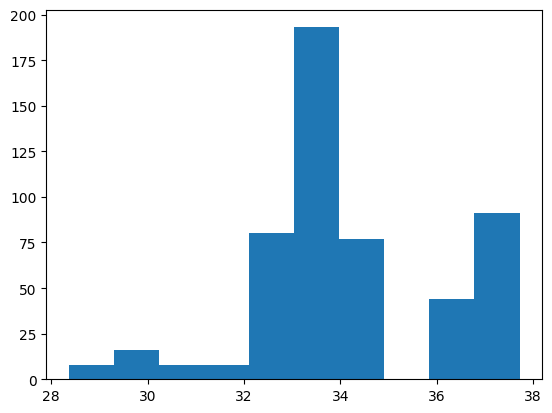

In [16]:
# Usaremos el método "cut" en pandas para segmentar la columna "Max Speed (Historical Player Maximum)"

plt.hist(week["Max Speed (Historical Player Maximum)"])
plt.show()

In [17]:
# Construimos un array para las segmentaciones inluyendo el valor mínimo y máximo.

bins = np.linspace(min(week["Max Speed (Historical Player Maximum)"]), max(week["Max Speed (Historical Player Maximum)"]), 4)

In [18]:
# Le damos un nombre a cada una de las segmentaciones.

velocidad_grupos = ['Vel Baja', 'Vel Media', 'Vel Alta']

In [19]:
week['Vel Historica Agrupada'] = pd.cut(week['Max Speed (Historical Player Maximum)'], bins, labels=velocidad_grupos, include_lowest=True )

week["Vel Historica Agrupada"].value_counts()

Vel Media    350
Vel Alta     135
Vel Baja      40
Name: Vel Historica Agrupada, dtype: int64

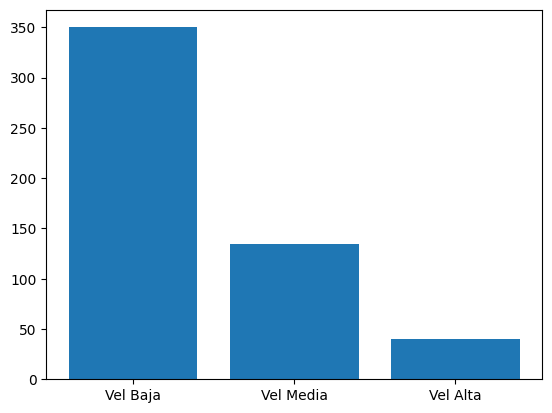

In [20]:
# Vemos el gráfico de como quedó la distribución de las segmentaciones.

plt.bar(velocidad_grupos, week["Vel Historica Agrupada"].value_counts())

plt.show()

Esto nos sirve para agrupar el rango de valores para tener sólamente 3 y no un rango de valores muy disparado entre ellos.

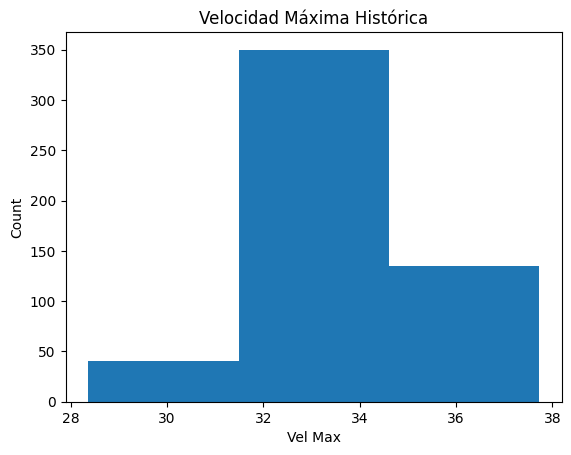

In [21]:
# Aquí podemos observar como queda la distribución con 3 barras agrupadas su respectiva cuenta y velocidad máxima.

plt.hist(week["Max Speed (Historical Player Maximum)"], bins = 3)

# set x/y labels and plot title
plt.xlabel("Vel Max")
plt.ylabel("Count")
plt.title("Velocidad Máxima Histórica")
plt.show()

In [22]:
#Se identifica un error entre el nombre de los defensores centrales, existe la posición: Centre Back y Center Back. Procedemos a normalizar el nombre para que sea Center Back.

week = week.replace('Centre Back', 'Center Back')

In [23]:
# Así nos resulta el Dataset con las características de DataWrangling, tomando camino hacia nuestro EDA

print(week)

                   Position         Session Type  Distance (m)  \
Username                                                         
phillippfarber   Midfielder             Tactical   8133.592821   
nereomarino     Center Back             Tactical   5086.417666   
patrickkrueger   Midfielder             Tactical    718.713690   
marvinsharpe         Winger             Tactical   9572.792150   
kianlong         Right Back             Tactical   8278.748661   
...                     ...                  ...           ...   
georgeconnolly    Left Back  Coadjuvant Recovery   1129.474755   
davutmeijs           Winger  Coadjuvant Recovery   1086.832229   
luisribeiro          Winger  Coadjuvant Recovery   1198.952413   
marmion           Left Back  Coadjuvant Recovery    981.093150   
nereomarino     Center Back  Coadjuvant Recovery    911.921996   

                Speed Zones (m) [0.0, 6.0]  Speed Zones (m) [6.0, 12.0]  \
Username                                                          

#**Análisis Estadístico de Datos (EDA)**



## **1.¿Qué tipo de entrenamiento es más popular?**

Con el siguiente gráfico encontramos que el entrenamiento ***táctico colectivo*** tiene la mayor densidad de entrenamiento dentro de las sesiones. Lo cual nos podría indicar que el tipo de entrenamiento llevado a cabo forma parte de las nuevas tendencias en entrenamiento como lo es la Periodización Táctica o el Entrenamiento Estructurado, donde en la sesión no se separa ninguno de los elementos del juego para entrenarlos por separado.


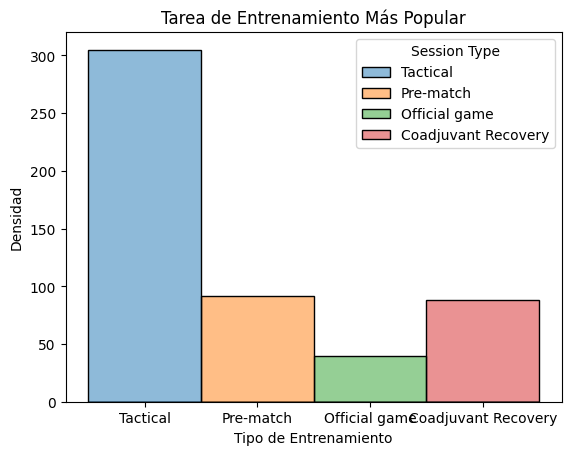

In [24]:
ax=sns.histplot(
    data=week, hue="Session Type",
    x="Session Type")
ax.set(xlabel='Tipo de Entrenamiento', ylabel='Densidad', title='Tarea de Entrenamiento Más Popular')

plt.rc('xtick', labelsize=7)
plt.show()


## **2.¿Qué días de la semana es cuando más carga de trabajo en metros recorridos hay?**

En el siguientegráfico podemos identificar el ***día de la semana que más carga en distancia*** tenemos; nos arroja un descubrimiento importante y es: que el fin de semana en sábado es el día que mayor carga tenemos ya que es el día de juego oficial y por obviedad la competencia genera mayor carga.

Lo que nos indica que la carga semanal de entrenamiento de la resistencia no está llegando a valores cercanos a la competencia por lo tanto se debería ajustar la carga para que los estímulos en los días de entrenamiento de la resistencia sean lo más cercanos al día de competencia.

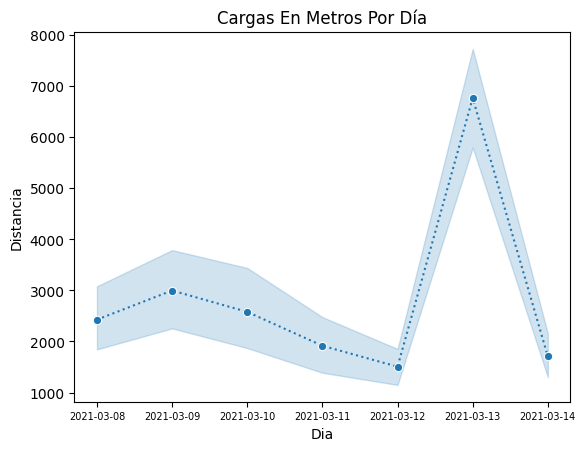

In [25]:
ax= sns.lineplot(x = "Session Date Convertida", y = "Distance (m)", data = week, marker="o", linestyle=":")
ax.set (xlabel='Dia', ylabel='Distancia', title='Cargas En Metros Por Día')
plt.rc('xtick', labelsize=5)
plt.show()

## **3.¿Cuáles son los jugadores con la mayor distancia recorrida?**

Con la suma de metros por jugador, encontramos que hay jugadores que tienen una elevada carga con respecto al de otros jugadores, estos descubrimientos nos pueden decir que dentro de las tareas de entrenamiento o incluso juegos oficiales han tenido un rendimiento mas bajo de lo normal.
Incluso nos podría indicar a los jugadores que están apartados del entrenamiento haciendo tareas diferenciadas debido a una lesión.

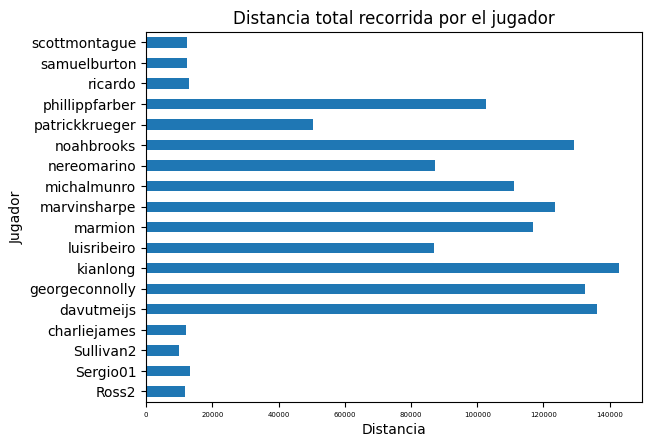

In [26]:
week.groupby('Username')['Distance (m)'].sum().plot(kind='barh')

plt.xlabel('Distancia')
plt.ylabel('Jugador')
plt.title('Distancia total recorrida por el jugador')
plt.show()

## **4.¿Quiénes son los jugadores más veloces? y si existe alguna relación respecto a su posición en el terreno de juego.**

Con este gráfico de cajas podemos observar a los jugadores y su posición y quienes fueron los que alcanzan mayor velocidad durante la semana.

Descubrimos que las posiciones tienen un pico de velocidad máxima similar y, los valores por debajo nos hablan de aspectos tacticos que pudieran repercutir en el desempeño del equipo, vemos la posición de defensor central que tiene valores muy bajos lo cual nos habla de que el jugador pudo haber estado caminando y desconectado de las fases del juego; vemos también valores bajos en extremos y laterales lo cual nos hablaría que están teniendo regresos a defender la posición muy lenta.

Cabe destacar el trabajo de los medicampistas ya que pasan por la mayoría de las zonas de velocidad, por lo tanto nos indica una implicación máxima en el juego y con el equipo estando atentos a las transiciones, apoyos, desmarques, etc.

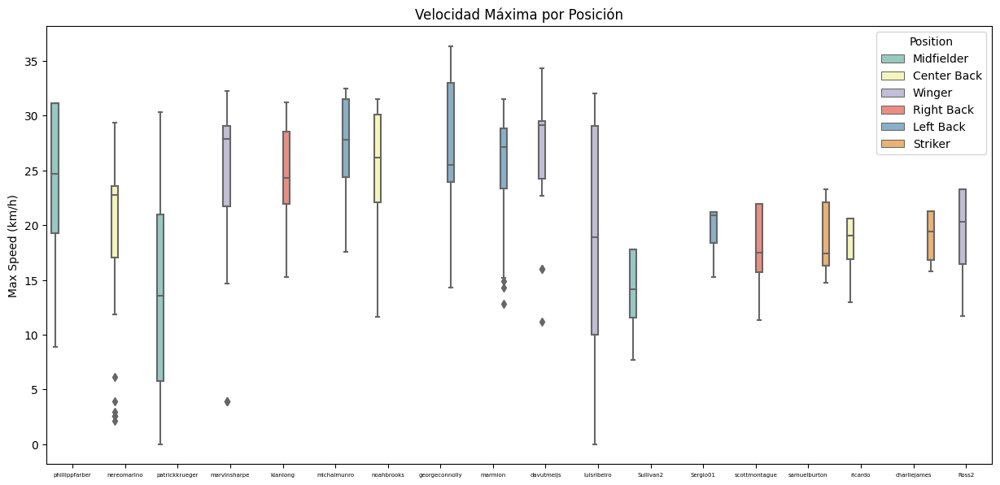

In [27]:
ax = plt.subplots(figsize = (15, 7))

indices = week.index.tolist()
ax=sns.boxplot(data=week, x=indices, y="Max Speed (km/h)",  palette = "Set3", hue= "Position")
ax.set(title='Velocidad Máxima por Posición')
plt.rc('xtick', labelsize=6)
plt.show()

<ipython-input-28-d0052a1b6be3>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(week.corr(), annot = True, cmap = 'Wistia')


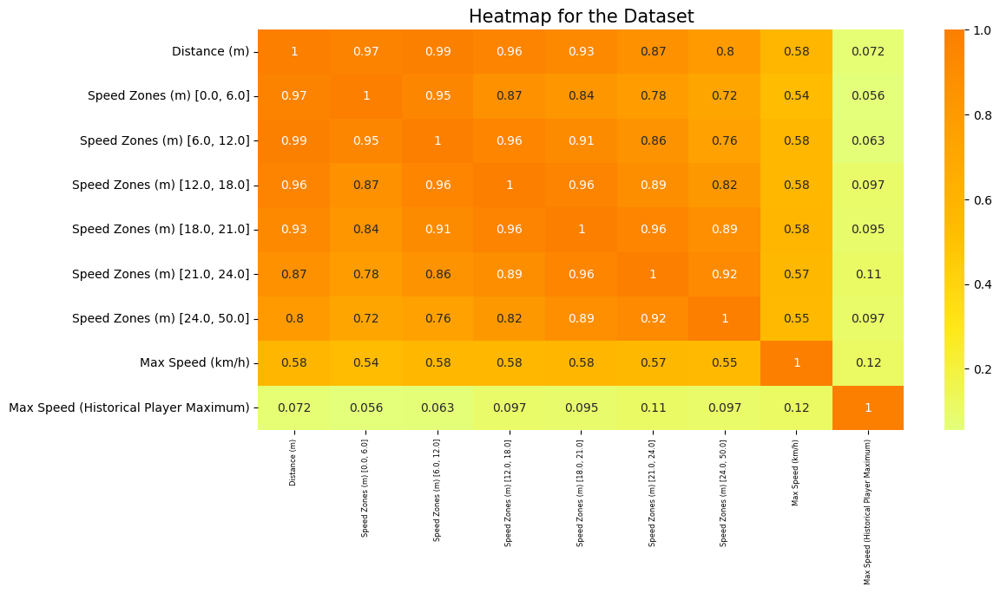

In [28]:
#Hagamos un HeatMap del df
#Para buscar correlaciones entre las variables del DataFrame
plt.rcParams['figure.figsize'] = (12, 6)

sns.heatmap(week.corr(), annot = True, cmap = 'Wistia')
plt.title('Heatmap for the Dataset', fontsize = 15)
plt.show()

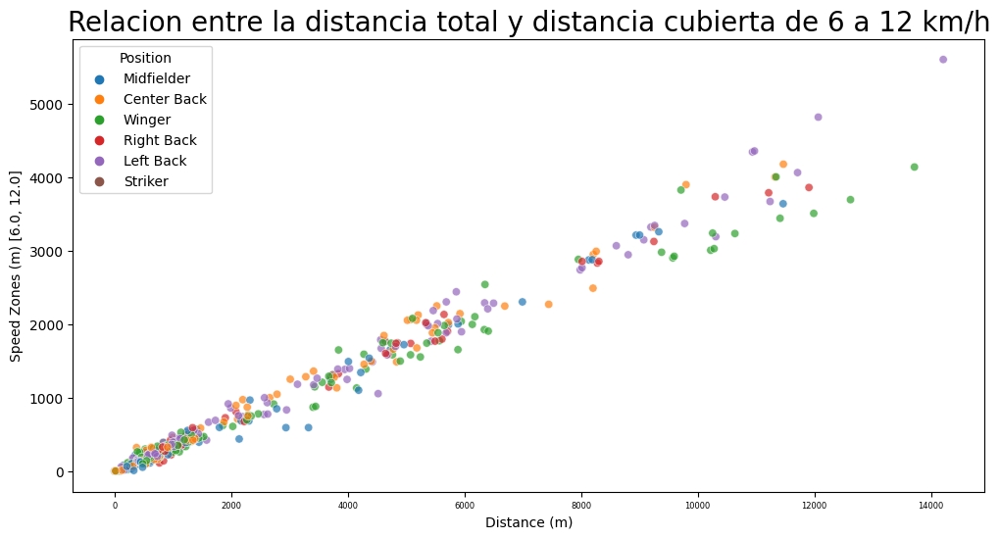

In [32]:
#Distancia vs Mts. en Velocidad de 6 a 12 km/h

sns.scatterplot(y="Speed Zones (m) [6.0, 12.0]", x="Distance (m)", data=week, hue="Position", alpha=.7)
plt.title('Relacion entre la distancia total y distancia cubierta de 6 a 12 km/h', fontsize = 20, fontweight = 30)
plt.show()

# **Pandas Profilling**

In [33]:
!pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 353.0/353.0 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 8.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 49.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 33.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 46.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 86.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=2efe0c7f5838bc1d9d2f88dee671847cca63b0e818538b7cb17801f69f0a877d
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    Uninstalling wordcloud-1.8.2.2:
      Successfully uninstalled wordcloud-1.8.2.2


In [34]:
from ydata_profiling import ProfileReport

In [36]:
profile = ProfileReport(week, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]